In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

from IPython.core.debugger import Tracer
import pandas       as pd
import numpy        as np
import scipy        as spy
import scipy.signal as sc
import matplotlib.pyplot   as plt
from matplotlib.backends.backend_pdf import PdfPages
# import mpld3
from scipy.fftpack import fft
import peakutils


In [2]:
"""Read data into x,y and z"""
df = pd.read_csv('75926_new.csv')

cut = 1
time = df["Timestamp"]


g = 9.81  

x = df["X-Axis"]*g ## To m/s^2
y = df["Y-Axis"]*g ## To m/s^2
z = df["Z-Axis"]*g ## To m/s^2


In [3]:
"""FFT script"""

def amplitude_sepctrum(x, fs):
    T = 1.0 / fs
    N = x.shape[0]
    fft_x = fft(x)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    
    return xf,  2.0/N * np.abs(fft_x[0:N//2])

"""Reample to get better integration results"""

def up_sample(x, N):
    Ns = x.shape[0]*N
    x = spy.signal.resample(x, Ns)
    return x

"""Filter script"""

def filter_signal(x, f_cutoff, fs):
    pad = np.int(x.shape[0]/2)
    Nf = 4 # Filter order
    nyq = fs/2.
    Wn = f_cutoff/nyq
#     print(Wn)
    sos = spy.signal.butter(Nf, Wn, btype='high', analog=False, output='sos')

    x_padded = np.pad(x, (pad,pad), 'edge') ## Edge pad signals to eliminate filter transition response
    xf = spy.signal.sosfilt(sos, x_padded)
    xf = xf[pad:-pad] # Remove paded values
    
    return xf

"""Integrate script"""
def integrate_accel(x, fs):
    velocity     = spy.integrate.cumtrapz(x)/fs
    velocity = np.insert(velocity, 0, velocity[0])
    displacement = spy.integrate.cumtrapz(velocity)/fs
    displacement = np.insert(displacement, 0, displacement[0])    
    nn = displacement.shape[0]
    t = np.linspace(0, nn, nn, endpoint=False)/fs
    return x, velocity, displacement, t

"""Time domain summary"""
def time_domain_summary( t, x):

    mean            = np.mean( x )
    median          = np.median( x )
    peak            = np.max( x )
    valley          = np.min( x )
    kurtosis        = spy.stats.kurtosis( x ) # Excess kurtosis. #, axis=0, fisher=True, bias=True )
    peak_to_peak    = peak - valley
    variance        = np.var( x )
    mad             = np.median( [ np.abs(j-median) for j in x ] )
    rms_as_in_pdf   = np.sqrt( variance )
    rms             = np.sqrt( np.mean( [ j**2 for j in x ] ))
    stdev           = np.sqrt( variance )
    skew            = spy.stats.skew( x )
    crest           = peak / rms_as_in_pdf

    

    summary = { "mean": mean, "median": median, "peak": peak, "valley": valley,
            "kurtosis": kurtosis,
            "peak_to_peak": peak_to_peak, "variance": variance, "mad": mad,
            "rms_as_in_pdf": rms_as_in_pdf,
            "rms": rms, "stdev": stdev, "skew": skew, "crest": crest }

   
    return summary




In [4]:
fs = 1600.
N = 10 ## Upsample N times
fs = fs*N
x = up_sample(x, N)
y = up_sample(y, N)
z = up_sample(z, N)

f_cutoff  = 10; 

x, Ix, IIx, t = integrate_accel(x, fs)
x = filter_signal(x, f_cutoff, fs)
Ix = filter_signal(Ix, f_cutoff, fs)*1000 ## To mm/s
IIx = filter_signal(IIx, f_cutoff, fs)*1000**2 ## To um


y, Iy, IIy, t = integrate_accel(y, fs)
y = filter_signal(y, f_cutoff, fs)
Iy = filter_signal(Iy, f_cutoff, fs)*1000 ## To mm/s
IIy = filter_signal(IIy, f_cutoff, fs)*1000**2 ## To um


z, Iz, IIz, t = integrate_accel(z, fs)
z = filter_signal(z, f_cutoff, fs)
Iz = filter_signal(Iz, f_cutoff, fs)*1000 ## To mm/s
IIz = filter_signal(IIz, f_cutoff, fs)*1000**2 ## To um



In [5]:
"""Calculate statistics of time domain data"""
Summary_x = [time_domain_summary(t,x), time_domain_summary(t,Ix), time_domain_summary(t,IIx)]

Summary_y = [time_domain_summary(t,y), time_domain_summary(t,Iy), time_domain_summary(t,IIy)]

Summary_z = [time_domain_summary(t,z), time_domain_summary(t,Iz), time_domain_summary(t,IIz)]

thresold_peaks =0.5 # Peak detection threshold
distance_peaks = 10 # Minimum distance between 2 peaks

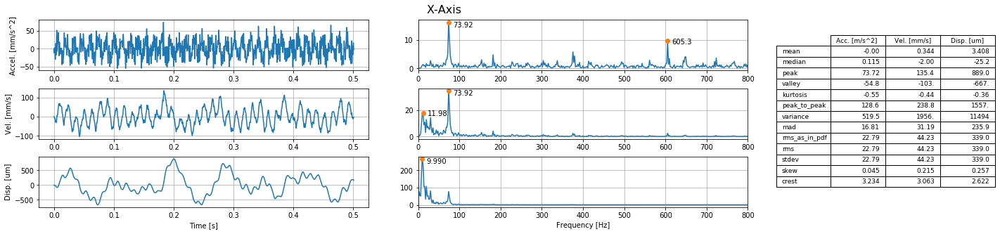

In [6]:
""" The results for x direction"""
n_dig = 5
rows = []
values =  []
columns = ('Acc. [m/s^2] ', 'Vel. [mm/s]', 'Disp. [um]')

for key in Summary_x[0]:
    rows.append(key)
    values.append([str(Summary_x[0][key])[0:n_dig], str(Summary_x[1][key])[0:n_dig], str(Summary_x[2][key])[0:n_dig]])

fig = plt.figure(figsize=(20,5))
fig.suptitle('X-Axis', fontsize=16)
plt.subplot(3,2,1)
plt.plot(t, x)
plt.grid()
plt.ylabel("Accel. [mm/s^2]")



plt.subplot(3,2,2)

the_table = plt.table(cellText=values,
                      rowLabels=rows,
#                       rowColours=colors,
                      colLabels=columns,
                      bbox=(1.25,-2.3,0.5,3))
freq, FX = amplitude_sepctrum(x, fs)
plt.plot(freq, FX)

"""PEAKS FX"""
indexes = peakutils.indexes(FX, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FX[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FX[index]*0.9) )



plt.xlim((0,800))
plt.grid()

## Velocity
plt.subplot(3,2,3)
plt.plot(t, Ix)
plt.grid()
plt.ylabel("Vel. [mm/s]")
plt.subplot(3,2,4)
freq, FIX = amplitude_sepctrum(Ix, fs)
plt.plot(freq, FIX)

"""PEAKS FIX"""
indexes = peakutils.indexes(FIX, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FIX[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FIX[index]*0.9) )

plt.xlim((0,800))
plt.grid()

## Displacement
plt.subplot(3,2,5)
plt.plot(t, IIx)
plt.grid()
plt.ylabel("Disp. [um]")
plt.xlabel('Time [s]')
plt.subplot(3,2,6)
freq, FIIX = amplitude_sepctrum(IIx, fs)
plt.plot(freq, FIIX)

"""PEAKS FIIX"""
indexes = peakutils.indexes(FIIX, thres=thresold_peaks, min_dist=distance_peaks)

plt.plot(freq[indexes], FIIX[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FIIX[index]*0.9) )

plt.xlim((0,800))
plt.grid()
plt.xlabel('Frequency [Hz]')


plt.subplots_adjust(top=0.92, bottom=0.18, left=0.1, right=0.8, hspace=0.35,
                    wspace=0.15)



fig.savefig("75926_Xaxis.pdf", bbox_inches='tight')
# mpld3.display()

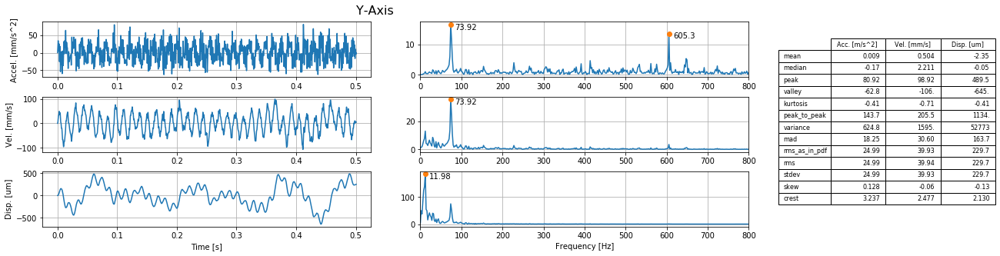

In [7]:
""" The results for y direction"""

n_dig = 5
rows = []
values =  []
columns = ('Acc. [m/s^2] ', 'Vel. [mm/s]', 'Disp. [um]')

for key in Summary_x[0]:
    rows.append(key)
    values.append([str(Summary_y[0][key])[0:n_dig], str(Summary_y[1][key])[0:n_dig], str(Summary_y[2][key])[0:n_dig]])


fig = plt.figure(figsize=(15,5))
fig.suptitle('Y-Axis', fontsize=16)
plt.subplot(3,2,1)
plt.plot(t, y)
plt.grid()
plt.ylabel("Accel. [mm/s^2]")

plt.subplot(3,2,2)

the_table = plt.table(cellText=values,
                      rowLabels=rows,
#                       rowColours=colors,
                      colLabels=columns,
                      bbox=(1.25,-2.3,0.5,3))

freq, FY = amplitude_sepctrum(y, fs)
plt.plot(freq, FY)

"""PEAKS FY"""
indexes = peakutils.indexes(FY, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FY[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FY[index]*0.9) )

plt.xlim((0,800))
plt.grid()


## Velocity
plt.subplot(3,2,3)
plt.plot(t, Iy)
plt.grid()
plt.ylabel("Vel. [mm/s]")
plt.subplot(3,2,4)
freq, FIY = amplitude_sepctrum(Iy, fs)
plt.plot(freq, FIY)
"""PEAKS FIY"""
indexes = peakutils.indexes(FIY, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FIY[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FIY[index]*0.9) )


plt.xlim((0,800))
plt.grid()

## Displacement
plt.subplot(3,2,5)
plt.plot(t, IIy)
plt.grid()
plt.ylabel("Disp. [um]")
plt.xlabel('Time [s]')
plt.subplot(3,2,6)
freq, FIIY = amplitude_sepctrum(IIy, fs)
plt.plot(freq, FIIY)

"""PEAKS FIIY"""
indexes = peakutils.indexes(FIIY, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FIIY[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FIIY[index]*0.9) )

plt.xlim((0,800))
plt.grid()
plt.xlabel('Frequency [Hz]')


plt.subplots_adjust(top=0.92, bottom=0.18, left=0.1, right=0.95, hspace=0.35,
                    wspace=0.15)

fig.savefig("75926_Yaxis.pdf", bbox_inches='tight')

# mpld3.display()


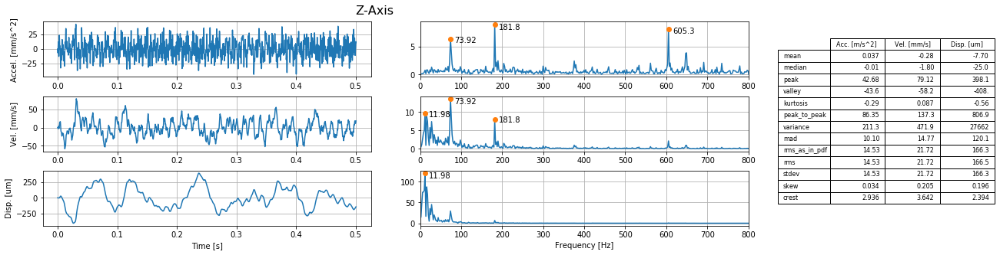

In [8]:
""" The results for z direction"""
n_dig = 5
rows = []
values =  []
columns = ('Acc. [m/s^2] ', 'Vel. [mm/s]', 'Disp. [um]')

for key in Summary_x[0]:
    rows.append(key)
    values.append([str(Summary_z[0][key])[0:n_dig], str(Summary_z[1][key])[0:n_dig], str(Summary_z[2][key])[0:n_dig]])


fig = plt.figure(figsize=(15,5))
fig.suptitle('Z-Axis', fontsize=16)

plt.subplot(3,2,1)
plt.plot(t, z)
plt.grid()
plt.ylabel("Accel. [mm/s^2]")

plt.subplot(3,2,2)

the_table = plt.table(cellText=values,
                      rowLabels=rows,
#                       rowColours=colors,
                      colLabels=columns,
                      bbox=(1.25,-2.3,0.5,3))

freq, FZ = amplitude_sepctrum(z, fs)
plt.plot(freq, FZ)

"""PEAKS FZ"""
indexes = peakutils.indexes(FZ, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FZ[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FZ[index]*0.9) )

plt.grid()
plt.xlim((0,800))



## Velocity
plt.subplot(3,2,3)
plt.plot(t, Iz)
plt.grid()
plt.ylabel("Vel. [mm/s]")
plt.subplot(3,2,4)
freq, FIZ = amplitude_sepctrum(Iz, fs)
plt.plot(freq, FIZ)
"""PEAKS FIZ"""
indexes = peakutils.indexes(FIZ, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FIZ[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FIZ[index]*0.9) )


plt.grid()
plt.xlim((0,800))


## Displacement
plt.subplot(3,2,5)
plt.plot(t, IIz)
plt.grid()
plt.ylabel("Disp. [um]")
plt.xlabel('Time [s]')
plt.subplot(3,2,6)
freq, FIIZ = amplitude_sepctrum(IIz, fs)
plt.plot(freq, FIIZ)
"""PEAKS FIIZ"""
indexes = peakutils.indexes(FIIZ, thres=thresold_peaks, min_dist=distance_peaks)
plt.plot(freq[indexes], FIIZ[indexes], 'o')    
for index in indexes: 
    plt.annotate(str(freq[index])[0:5], (freq[index]+10, FIIZ[index]*0.9) )


plt.xlim((0,800))
plt.grid()
plt.xlabel('Frequency [Hz]')


plt.subplots_adjust(top=0.92, bottom=0.18, left=0.1, right=0.95, hspace=0.35,
                    wspace=0.15)

fig.savefig("75926_Zaxis.pdf", bbox_inches='tight')


# mpld3.display()


In [9]:
"""Plotly function to produce figures"""
from plotly import tools
import plotly.plotly as py
import plotly
import plotly.graph_objs as go
import plotly.io as pio
plotly.offline.init_notebook_mode(connected=True)

def plot_results(t_in,x_in, F_in, X_in, title_str, width_in, height_in, sig_type):
    if sig_type==0:
        unit = '[m/s^2]'
    elif sig_type==1:
        unit = '[mm/s]'
    elif sig_type==2:
        unit = '[mm]'
        
    
    trace1 = go.Scatter(
        x=t_in,
        y=x_in
    )
    trace2 = go.Scatter(
        x=F_in,
        y=X_in, 
        xaxis='x2',
        yaxis='y2'
    )

    data = [trace1, trace2, ]
    layout = go.Layout(
        title= title_str,
        margin=dict(l=70, r=30, b=50, t=30, pad=2),
        xaxis=dict(
            domain=[0, 0.45], 
            title='Time [s]'
        ),
        yaxis=dict(
            domain=[0, 1],         
            title='Amplitude ' + unit ,
            titlefont=dict(
            ), 
        ),
        xaxis2=dict(
            domain=[0.55, 1], 
            title='Frequency [Hz]',
            range = [0,800]
        ),
        yaxis2=dict(
            domain=[0, 1],
            title ='Amp. spectrum',
            anchor='x2', 
        ), 
        showlegend=False, 
        width= width_in, 
        height= height_in, 
    )
    return  go.Figure( data=data, layout=layout)

    



In [10]:
"""Plotly plots in X-Axis"""
w = 800
golden = (1 + 5 ** 0.5) / 2.

h = w/golden/2
figx_accel = plot_results(t,x, freq, FX, 'X-Axis acceleration', w, h, 0)
plotly.offline.iplot(figx_accel,  filename='X-Axis acceleration')

figx_vel = plot_results(t,Ix, freq, FIX, 'X-Axis speed', w, h, 1)
plotly.offline.iplot(figx_vel,  filename='X-Axis speed')

figx_disp = plot_results(t,IIx, freq, FIIX, 'X-Axis displacement', w, h, 2)
plotly.offline.iplot(figx_disp,  filename='X-Axis displacement')


In [11]:
"""Plotly plots in Y-Axis"""
w = 800
golden = (1 + 5 ** 0.5) / 2.

h = w/golden/2
figx_accel = plot_results(t,y, freq, FY, 'Y-Axis acceleration', w, h, 0)
plotly.offline.iplot(figx_accel,  filename='Y-Axis acceleration')

figx_vel = plot_results(t,Iy, freq, FIY, 'Y-Axis speed', w, h, 1)
plotly.offline.iplot(figx_vel,  filename='Y-Axis speed')

figx_disp = plot_results(t,IIy, freq, FIIY, 'Y-Axis displacement', w, h, 2)
plotly.offline.iplot(figx_disp,  filename='Y-Axis displacement')


In [12]:
"""Plotly plots in Z-Axis"""
w = 800
golden = (1 + 5 ** 0.5) / 2.

h = w/golden/2
figx_accel = plot_results(t,z, freq, FZ, 'Z-Axis acceleration', w, h, 0)
plotly.offline.iplot(figx_accel,  filename='Z-Axis acceleration')

figx_vel = plot_results(t,Iz, freq, FIZ, 'Z-Axis speed', w, h, 1)
plotly.offline.iplot(figx_vel,  filename='Z-Axis speed')

figx_disp = plot_results(t,IIz, freq, FIIZ, 'Z-Axis displacement', w, h, 2)
plotly.offline.iplot(figx_disp,  filename='Z-Axis displacement')
